<a href="https://colab.research.google.com/github/ArifahZhafirah/PCVK26_04_Arifah/blob/main/P2_Tugas%20D3_04.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Membuat koneksi antar Colab dengan Google Drive

In [5]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [6]:
from google.colab import files
uploaded = files.upload()

Saving KTM.jpeg to KTM.jpeg


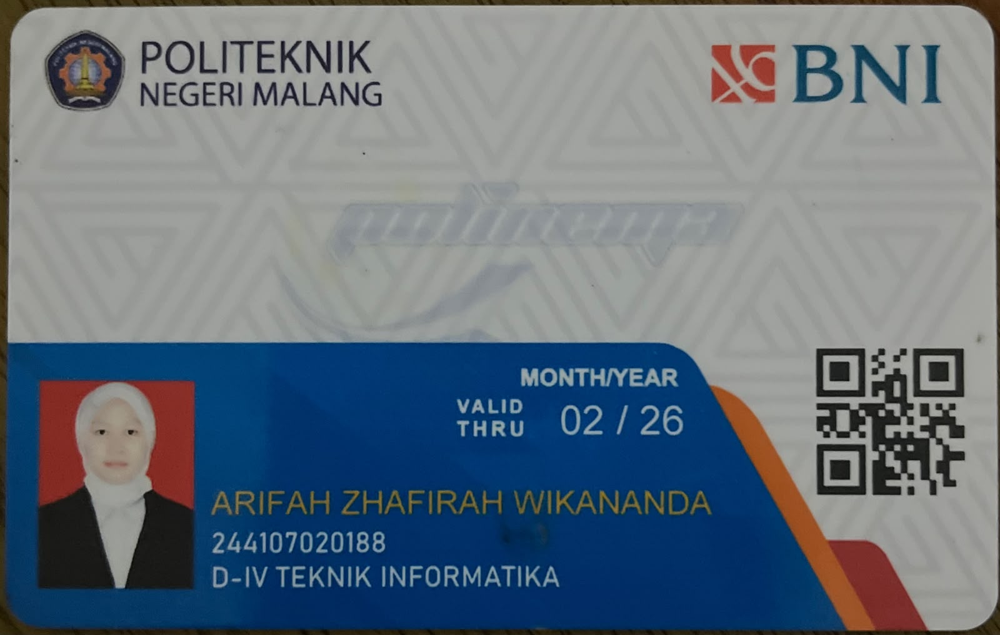

Resolusi gambar:  1600  x  1017


In [7]:
import cv2 as cv
from google.colab.patches import cv2_imshow
from skimage import io
import matplotlib.pyplot as plt
import numpy as np

img = cv.imread('KTM.jpeg')
cv2_imshow(img)

print("Resolusi gambar: ", img.shape[1], " x ", img.shape[0])

#Menampilkan gambar

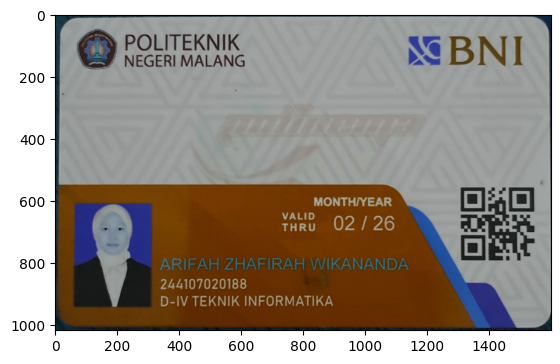

In [8]:
img = cv.imread('KTM.jpeg')
plt.imshow(img) #fromat warna BGR

cara ke-2

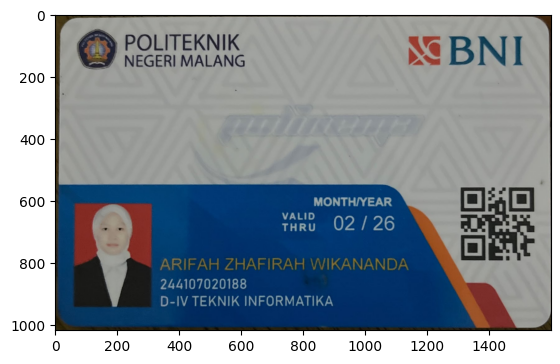

In [9]:
img = cv.imread('KTM.jpeg')
img2 =cv.cvtColor(img,cv.COLOR_BGR2RGB)   #konversi channel BGR ->RGB
plt.imshow(img2)

Cara Gabungan

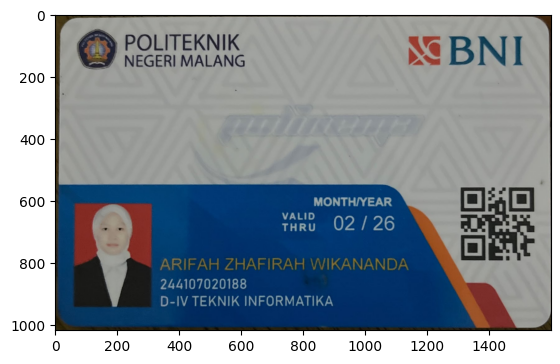

In [10]:
img = cv.imread('KTM.jpeg')
plt.imshow(cv.cvtColor(img,cv.COLOR_BGR2RGB))   #konversi channel BGR -> RGB
plt.show()

#Menampilkan Citra Grayscale

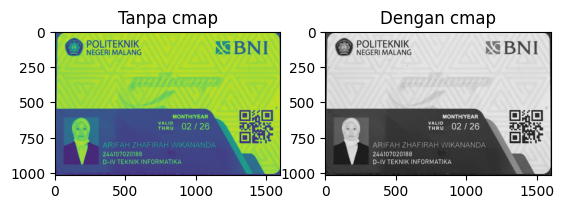

In [11]:
img_gray = cv.imread('KTM.jpeg', cv.IMREAD_GRAYSCALE)

# Tanpa cmap
plt.subplot(1,2,1)
plt.imshow(img_gray)
plt.title('Tanpa cmap')

# Dengan cmap
plt.subplot(1,2,2)
plt.imshow(img_gray, cmap='gray')
plt.title('Dengan cmap')

plt.show()

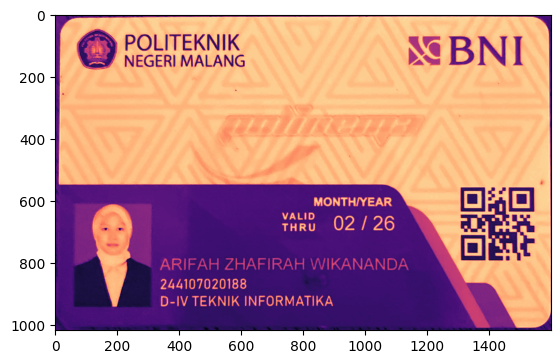

In [12]:
plt.imshow(img_gray, cmap='magma')

#Melakukan Resizing

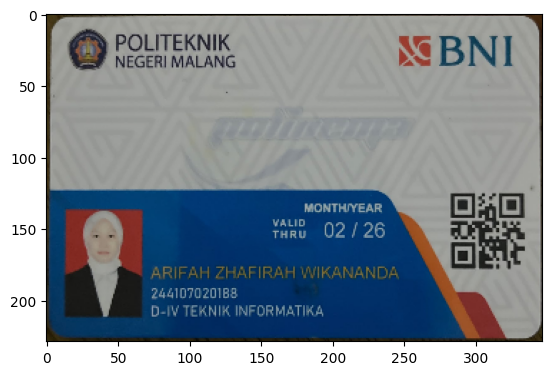

In [13]:
imgRGB = cv.cvtColor(img,cv.COLOR_BGR2RGB)   #konversi BGR ke RGB
img_output = cv.resize(imgRGB, (347,229))
plt.imshow(img_output)

#Melakukan Flipping

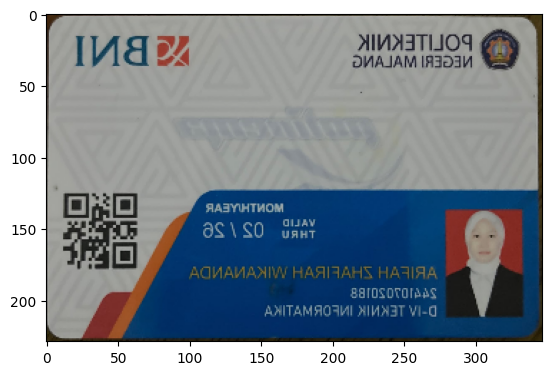

In [14]:
imgFlip=cv.flip(img_output,1)
plt.imshow(imgFlip)

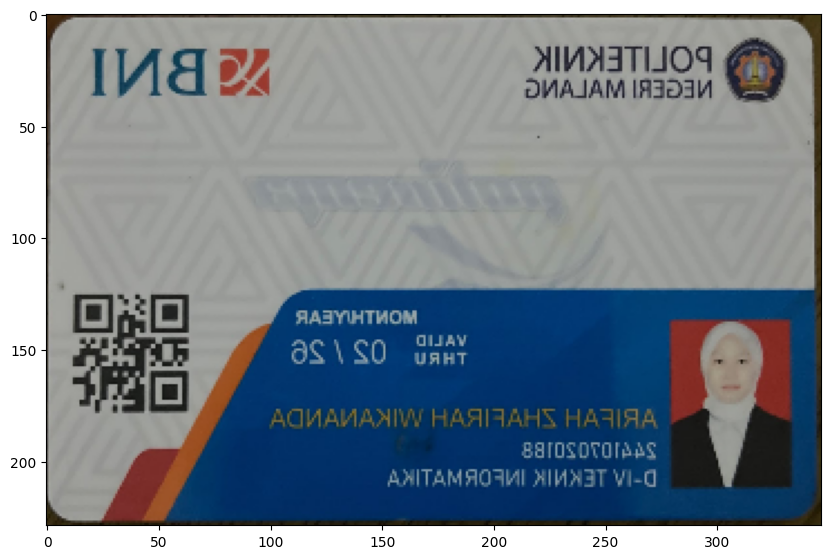

In [15]:
imgFlip=cv.flip(img_output,1)

#tampilkan ukuran canvas yang lebih besar
fig = plt.figure(figsize=(10,10))
ax=fig.add_subplot(1,1,1)
ax.imshow(imgFlip)

#Membuat bentuk geometri 2D dari OpenCV

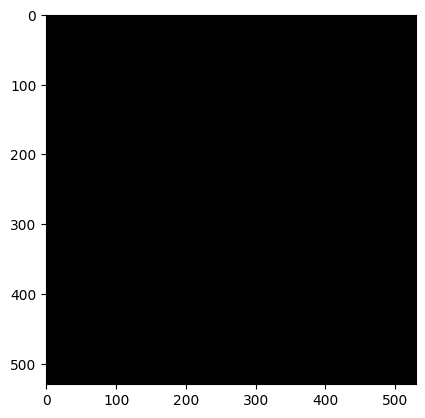

In [16]:
black_img = np.zeros(shape=(530,530,3),dtype=np.int16)
plt.imshow(black_img)

Menambahkan bentuk persegi panjang

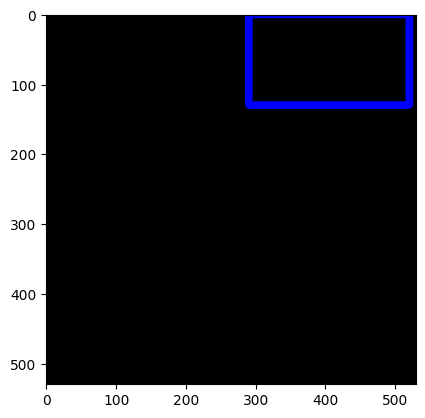

In [17]:
cv.rectangle(black_img,pt1=(290,0),pt2=(520,130),color=(0,0,255),thickness=10)
plt.imshow(black_img)

menambahkan bentuk persegi

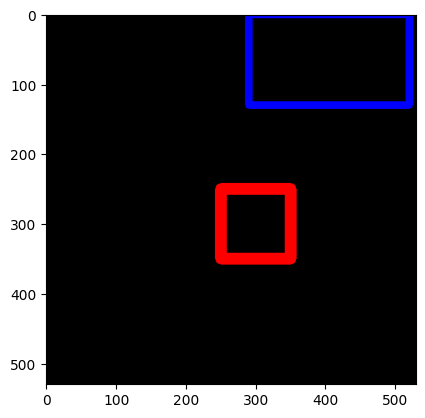

In [18]:
cv.rectangle(black_img,pt1=(250,250),pt2=(350,350),color=(255,0,0),thickness=15)
plt.imshow(black_img)

menambahkan bentuk lingkaran

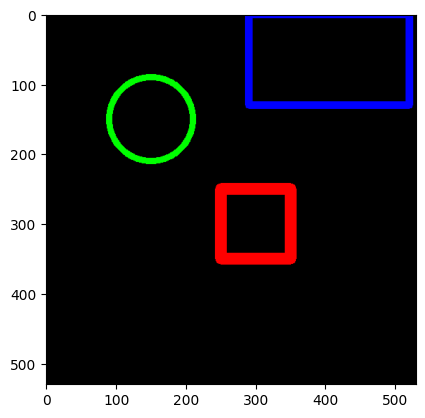

In [19]:
cv.circle(black_img,center=(150,150),radius=60,color=(0,255,0),thickness=8)
plt.imshow(black_img)

Menambahkan Lingkaran Berwarna

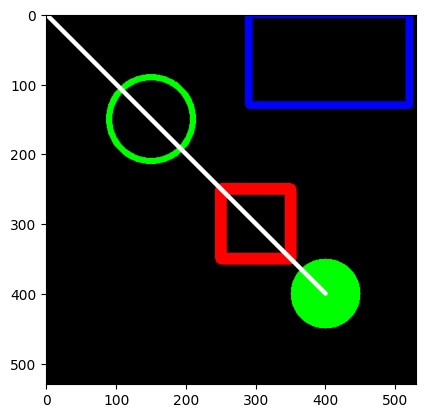

In [20]:
cv.circle(black_img,center=(400,400),radius=50,color=(0,255,0),thickness=-1)
cv.line(black_img,pt1=(0,0),pt2=(400,400),color=(255,255,255),thickness=5)
plt.imshow(black_img)

menambahkan Text dengan Font

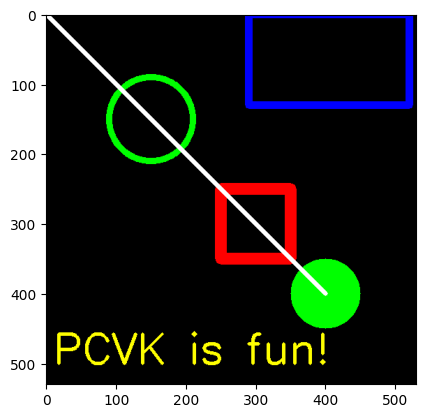

In [21]:
font = cv.FONT_HERSHEY_SIMPLEX
cv.putText(black_img,text='PCVK is fun!',org=(10,500),fontFace=font,fontScale=2,
                                         color=(255,255,0),thickness=3,lineType=cv.LINE_AA)
plt.imshow(black_img)

Membuat black image

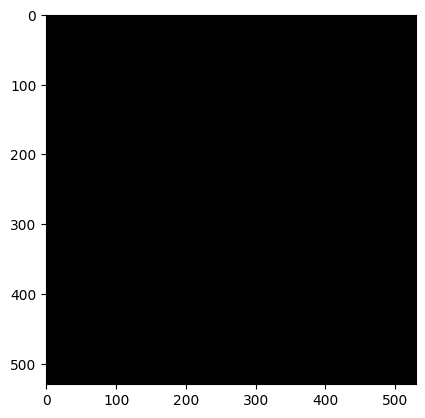

In [22]:
black_img2=np.zeros(shape=(530,530,3),dtype=np.int32)
plt.imshow(black_img2)

Kode program untuk inisialisasi Numpy array

In [23]:
vertices = np.array ([[150,350],[250,250],[450,350],[250,450]],dtype=np.int32)
vertices

array([[150, 350],
       [250, 250],
       [450, 350],
       [250, 450]], dtype=int32)

Kemudian array tersbut di reshape

In [24]:
pts = vertices.reshape((-1,1,2))  # nilai 2 untuk menunjukkan bahwa tiap titik dibuat 3 channel yang mewakili R, G dan B
pts

array([[[150, 350]],

       [[250, 250]],

       [[450, 350]],

       [[250, 450]]], dtype=int32)

Menambahkan polyline pada black image

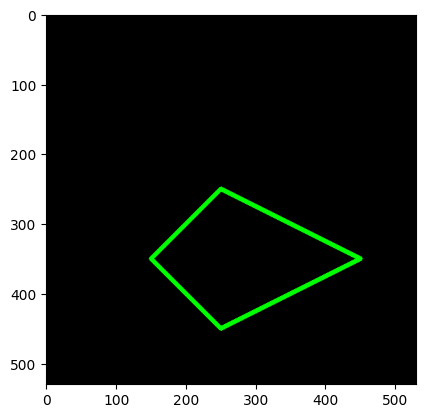

In [25]:
cv.polylines(black_img2,[pts],isClosed=True,color=(0,255,0),thickness=5)
plt.imshow(black_img2)

#PERTANYAAN PRAKTIKUM

1. Tampilkan satu citra bebas menggunakan cv2_imshow() dan plt.imshow()
tanpa konversi warna apa pun. Mengapa hasilnya berbeda? Buktikan dengan
mencetak nilai satu piksel yang sama dari kedua cara pembacaan tersebut.
Jawab: Hasil tampilannya berbeda karena urutan kanal warna jika cv2_imshow() dari OpenCV itu ada citra di dalam format BGR, jika plt.imshow() dari matplotlib ada citra dalam format RGB, simple nya itu jika OpenCV menyimpan format BGR, jika citra BGR langsung ditampilkan dengan plt.imshow() maka kanal merah dan biru akan tertukar

2. Buat kanvas hitam berukuran sama dengan tipe data int16 dan int32.
Bandingkan dtype, min(), max(), dan nbytes keduanya. Apakah tampilannya
berbeda? Apakah ukuran memorinya berbeda? Jelaskan alasannya.
Jawab: Taampilan keduanya sama-sama hitam karena semua nilai piksel adalah 0, untuk ukuran memorinya berbeda int32 2 kali lebih besar dari int16

3. Apa kegunaan baris from google.colab.patches import cv2_imshow, dan
mengapa cv2.imshow() bawaan OpenCV tidak dapat dipakai di Google Colab?
Jawab: Fungsi diatas adalah pengganti cv2.imshow() yang khusus dibuat untuk lingkungan Google Colab. cv2_imshow() menampilkan citra langsung sebagai output sel di notebook, bukan membuka jendela GUI terpisah.

4. Citra yang dibaca dengan skimage.io.imread() ditampilkan berdampingan
dengan hasil cv2.cvtColor(img, cv2.COLOR_BGR2RGB) atas citra yang
sama. Manakah yang menampilkan warna sebenarnya, dan manakah yang
kanalnya tertukar? Buktikan dengan nilai piksel, bukan dengan pengamatan
visual saja.
Jawab: skimage.io.imread() secara default membaca citra dalam format RGB(urutan yang benar untuk ditampilkan) namun cv2.imread() membaca citra dalam format BGR, cv2,cvtColor(img, cv2.COLOR_BGR2RGB) mengubah BGR menjadi RGB

5. Setelah citra ditampilkan dengan figsize yang jauh lebih besar, apakah nilai
img.shape ikut berubah? Jelaskan perbedaan antara mengubah ukuran citra
dan mengubah ukuran tampilan.
Jawab: nilai img.shape tidak berubah setelah mengatur figsize. figsize hanya mengatur ukuran kanvas atau bingkai tampilan dalam satuan inci saat citra ditampilkan di plot. Nilai img.shape mencerminkan jumlah piksel sebenarnya yang tersimpan dalam array NumPy.

Pembuktian mencetak nilai piksel


--- plt.imshow tanpa konversi ---


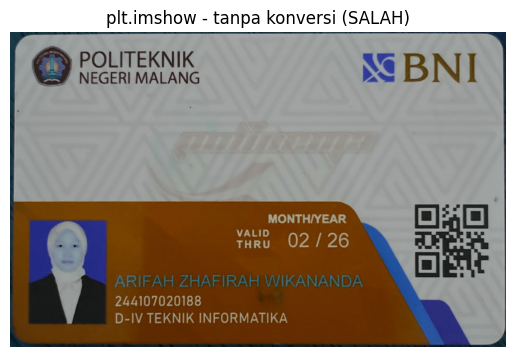


--- plt.imshow setelah konversi ---


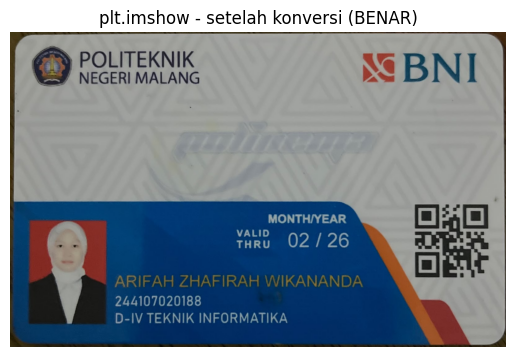


Nilai piksel di tengah:
BGR: [150 154 149]
RGB: [149 154 150]


In [26]:
# Tampilkan dengan plt.imshow tanpa konversi
print("\n--- plt.imshow tanpa konversi ---")
plt.imshow(img)
plt.title('plt.imshow - tanpa konversi (SALAH)')
plt.axis('off')
plt.show()

# Tampilkan dengan plt.imshow setelah konversi
print("\n--- plt.imshow setelah konversi ---")
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)
plt.title('plt.imshow - setelah konversi (BENAR)')
plt.axis('off')
plt.show()

# Nilai piksel
print("\nNilai piksel di tengah:")
h, w = img.shape[:2]
print(f"BGR: {img[h//2, w//2]}")
print(f"RGB: {img_rgb[h//2, w//2]}")

Perbandingan Kanvas Hitam int16 dan int32

INFORMASI KANVAS int16
dtype      : int16
min()      : 0
max()      : 0
nbytes     : 1590000 bytes
shape      : (500, 530, 3)

INFORMASI KANVAS int32
dtype      : int32
min()      : 0
max()      : 0
nbytes     : 3370800 bytes
shape      : (530, 530, 3)


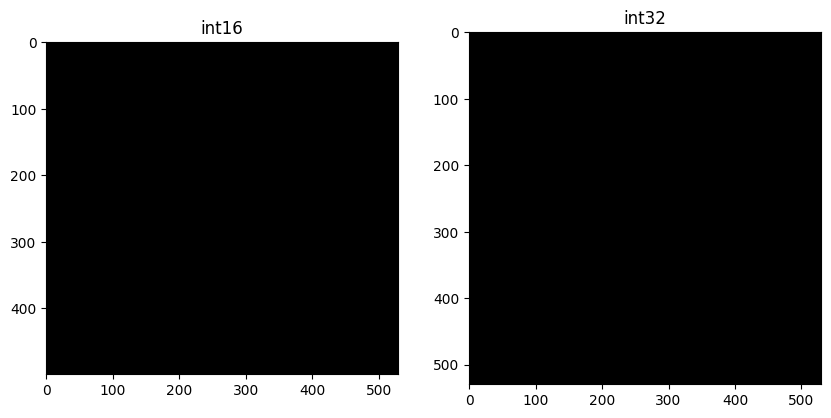

In [27]:
# Membuat kanvas hitam dengan tipe data int16
black_img_int16 = np.zeros(shape=(500, 530, 3), dtype=np.int16)

# Membuat kanvas hitam dengan tipe data int32
black_img_int32 = np.zeros(shape=(530, 530, 3), dtype=np.int32)

# Menampilkan informasi kedua kanvas
print("=" * 50)
print("INFORMASI KANVAS int16")
print("=" * 50)
print(f"dtype      : {black_img_int16.dtype}")
print(f"min()      : {black_img_int16.min()}")
print(f"max()      : {black_img_int16.max()}")
print(f"nbytes     : {black_img_int16.nbytes} bytes")
print(f"shape      : {black_img_int16.shape}")

print("\n" + "=" * 50)
print("INFORMASI KANVAS int32")
print("=" * 50)
print(f"dtype      : {black_img_int32.dtype}")
print(f"min()      : {black_img_int32.min()}")
print(f"max()      : {black_img_int32.max()}")
print(f"nbytes     : {black_img_int32.nbytes} bytes")
print(f"shape      : {black_img_int32.shape}")

# Menampilkan kedua kanvas
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
ax1.imshow(black_img_int16)
ax1.set_title('int16')
ax2.imshow(black_img_int32)
ax2.set_title('int32')
plt.show()

Perbandingan Skimage.io.imread() dengan cv2.cvColor()

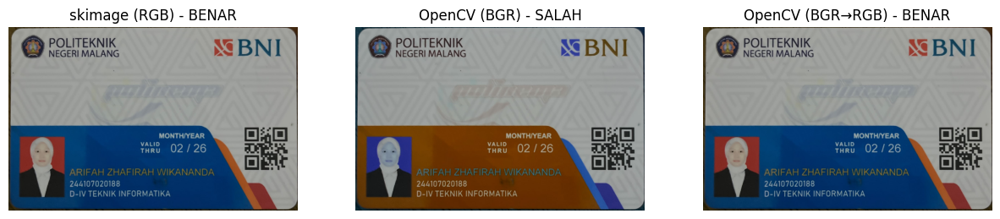


skimage (RGB): R=149, G=154, B=150
OpenCV (BGR):  B=150, G=154, R=149
OpenCV (RGB):  R=149, G=154, B=150


In [30]:
nama = 'KTM.jpeg'

img_sk = io.imread(nama)
img_cv = cv2.imread(nama)
img_cv_rgb = cv2.cvtColor(img_cv, cv2.COLOR_BGR2RGB)

# Tampilkan 3 gambar
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

axes[0].imshow(img_sk)
axes[0].set_title('skimage (RGB) - BENAR')
axes[0].axis('off')

axes[1].imshow(img_cv)
axes[1].set_title('OpenCV (BGR) - SALAH')
axes[1].axis('off')

axes[2].imshow(img_cv_rgb)
axes[2].set_title('OpenCV (BGR→RGB) - BENAR')
axes[2].axis('off')

plt.show()

# Nilai piksel
h, w = img_sk.shape[:2]
x, y = w//2, h//2

print(f"\nskimage (RGB): R={img_sk[y,x,0]}, G={img_sk[y,x,1]}, B={img_sk[y,x,2]}")
print(f"OpenCV (BGR):  B={img_cv[y,x,0]}, G={img_cv[y,x,1]}, R={img_cv[y,x,2]}")
print(f"OpenCV (RGB):  R={img_cv_rgb[y,x,0]}, G={img_cv_rgb[y,x,1]}, B={img_cv_rgb[y,x,2]}")

#TUGAS PRAKTIKUM-PENERAPAN

Tugas 1: Menampilkan kombinasi kanal merah-biru dan hijau-biru

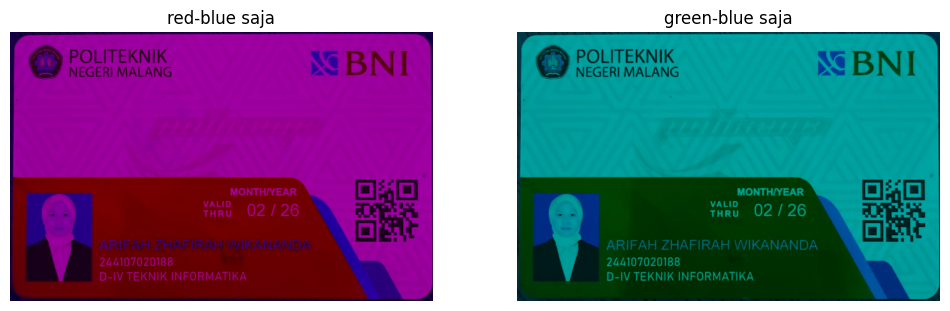

In [31]:
# Red-Blue
rb = img.copy()
rb[:, :, 1] = 0

# Green-Blue
gb = img.copy()
gb[:, :, 0] = 0

# Tampilkan
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
ax1.imshow(rb)
ax1.set_title('red-blue saja')
ax1.axis('off')

ax2.imshow(gb)
ax2.set_title('green-blue saja')
ax2.axis('off')

plt.show()

Menampilkan 3 bentuk pencerminan

Original:


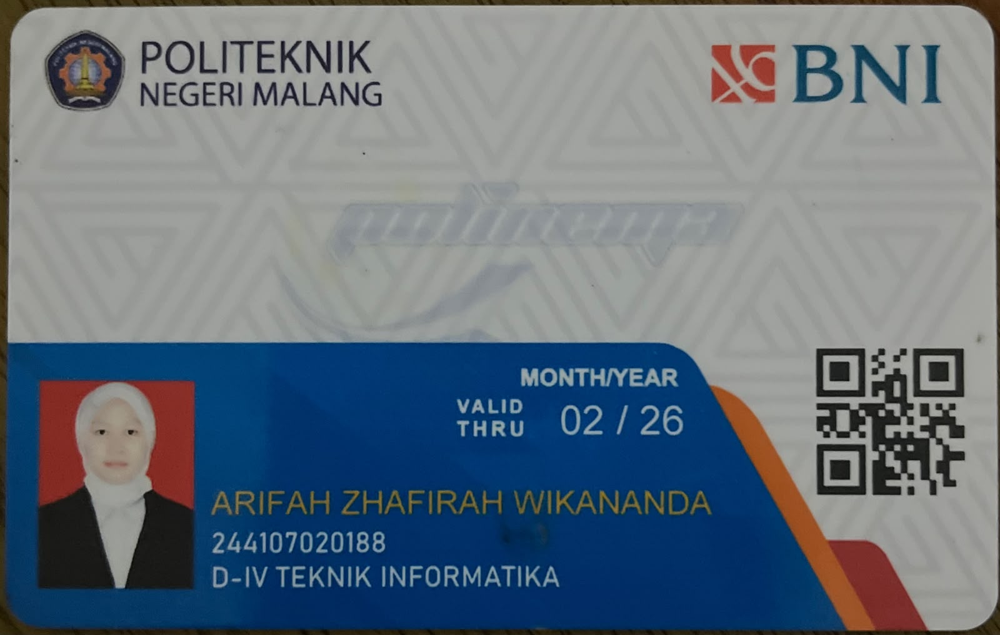

Vertikal (atas-bawah):


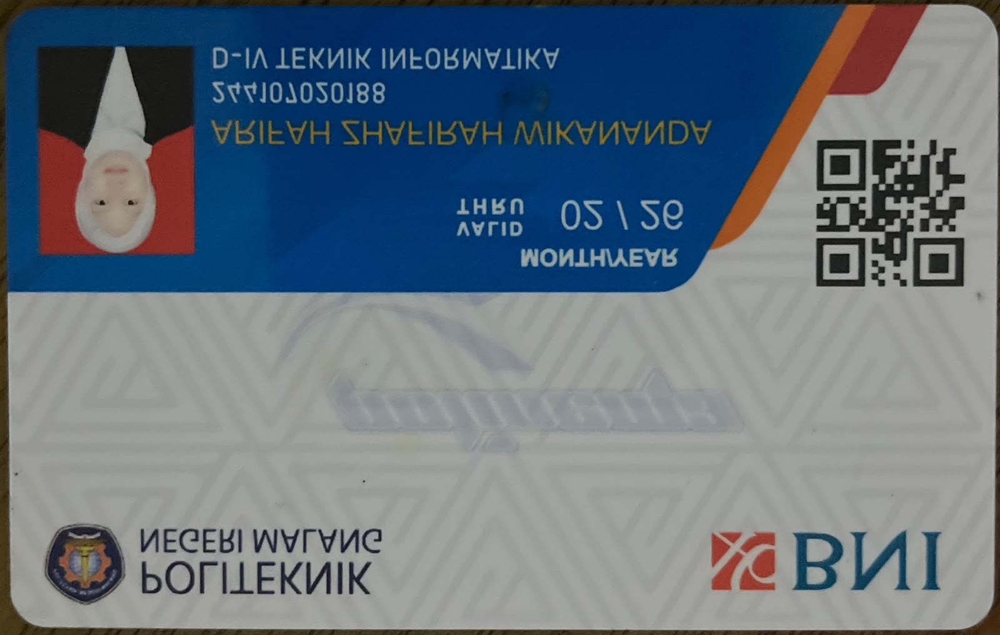

Horizontal (kiri-kanan):


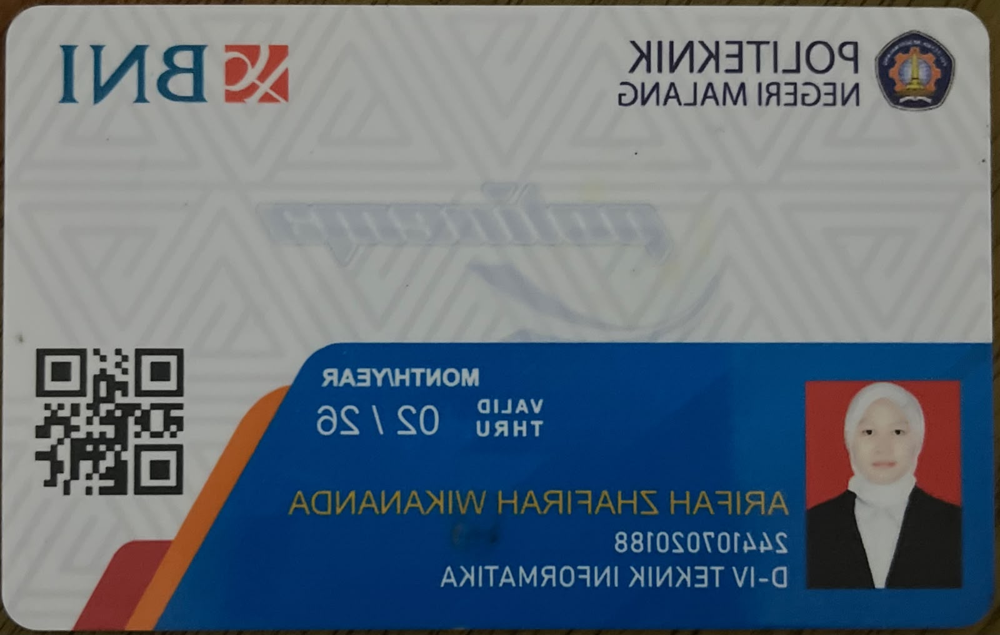

Keduanya:


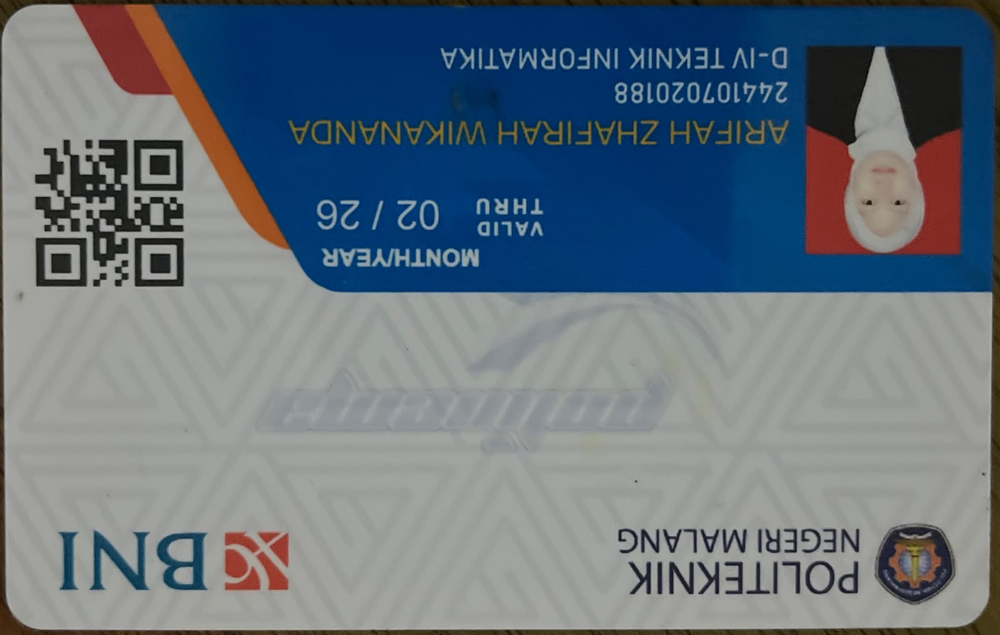

In [33]:
img = cv2.imread('KTM.jpeg')
if img is None:
    print("Error: File KTM.jpeg tidak ditemukan!")
    exit()

# Pencerminan (pakai BGR langsung)
vertikal = cv2.flip(img, 0)
horizontal = cv2.flip(img, 1)
keduanya = cv2.flip(img, -1)

# Tampilkan
print("Original:")
cv2_imshow(img)

print("Vertikal (atas-bawah):")
cv2_imshow(vertikal)

print("Horizontal (kiri-kanan):")
cv2_imshow(horizontal)

print("Keduanya:")
cv2_imshow(keduanya)

Menggambar rectangle, Circle, dan Teks pada foto Aktivitas

['.config', 'photos.jpeg', 'KTM.jpeg', 'drive', 'sample_data']


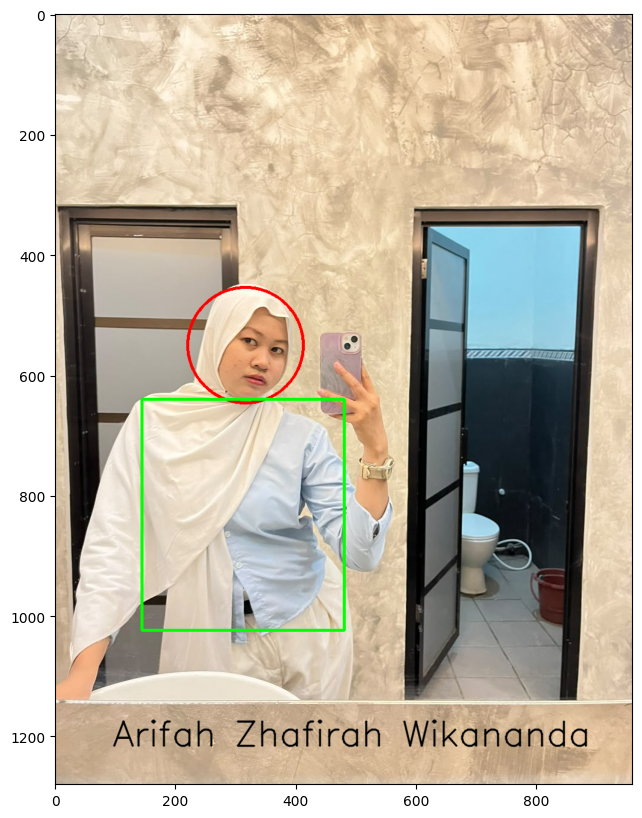

In [36]:
import cv2
import matplotlib.pyplot as plt
import os

print(os.listdir('.'))   # jalankan dulu untuk lihat file apa saja yang benar-benar ada

img = cv2.imread('photos.jpeg')
if img is None:
    raise FileNotFoundError("photos.jpeg tidak ditemukan — upload ulang filenya ke sesi Colab ini")

img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Gambar lingkaran merah di wajah
cv2.circle(img, (int(img.shape[1]*0.33), int(img.shape[0]*0.43)), int(min(img.shape[:2])*0.1), (255,0,0), 4)

# Gambar kotak hijau di badan
cv2.rectangle(img, (int(img.shape[1]*0.15), int(img.shape[0]*0.5)), (int(img.shape[1]*0.5), int(img.shape[0]*0.8)), (0,255,0), 4)

# Tulis nama
cv2.putText(img, 'Arifah Zhafirah Wikananda', (int(img.shape[1]*0.1), int(img.shape[0]*0.95)), cv2.FONT_HERSHEY_SIMPLEX, min(img.shape[:2])/500, (0,0,0), 2, cv2.LINE_AA)

plt.figure(figsize=(8,10))
plt.imshow(img)
plt.show()

#TUGAS PPRAKTIKUM - ANALISA

Rata-rata asli : 175.01
Rata-rata resize: 175.1
Selisih: 0.0989


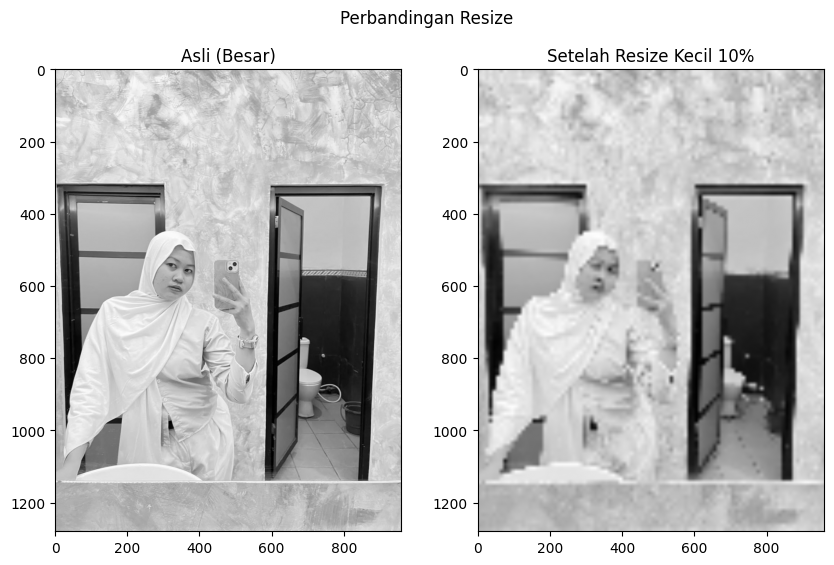

In [37]:
img = cv2.imread('photos.jpeg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Ambil rata-rata asli
a = np.mean(gray)

# Kecilkan sangat drastis (10% dari ukuran asli) lalu perbesar lagi
kecil = cv2.resize(gray, (0,0), fx=0.1, fy=0.1)
balik = cv2.resize(kecil, (gray.shape[1], gray.shape[0]))

# Ambil rata-rata setelah resize
b = np.mean(balik)

print("Rata-rata asli :", round(a, 2))
print("Rata-rata resize:", round(b, 2))
print("Selisih:", round(abs(a - b), 4))

# Tampilkan
plt.figure(figsize=(10, 6))

plt.subplot(1, 2, 1)
plt.imshow(gray, cmap='gray')
plt.title('Asli (Besar)')

plt.subplot(1, 2, 2)
plt.imshow(balik, cmap='gray')
plt.title('Setelah Resize Kecil 10%')

plt.suptitle('Perbandingan Resize')
plt.show()

#STUDI KASUS 1

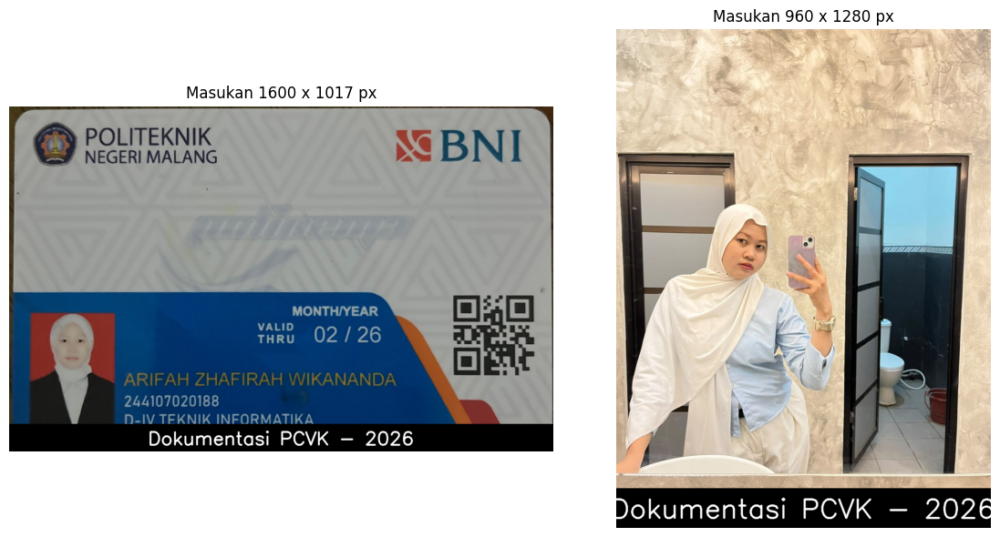

In [38]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def tambah_label_identitas(img_bgr, teks):
    """Menambahkan bar label di bagian bawah citra.
    Tinggi bar, skala font, dan ketebalan teks dihitung
    secara proporsional dari ukuran citra masukan (h, w)."""
    h, w = img_bgr.shape[:2]
    hasil = img_bgr.copy()

    # tinggi bar = 8% dari tinggi citra, minimal 1 px agar tidak nol pada citra sangat kecil
    tinggi_bar = max(1, int(h * 0.08))

    # bar solid di bagian bawah
    cv2.rectangle(hasil, (0, h - tinggi_bar), (w, h), color=(0, 0, 0), thickness=-1)

    # skala font & ketebalan mengikuti tinggi bar, bukan angka tetap
    skala_font = tinggi_bar / 45
    tebal_teks = max(1, tinggi_bar // 25)

    ukuran_teks, _ = cv2.getTextSize(teks, cv2.FONT_HERSHEY_SIMPLEX, skala_font, tebal_teks)
    teks_w, teks_h = ukuran_teks

    x = (w - teks_w) // 2
    # baseline teks di tengah bar; dijaga tidak lebih tinggi dari batas atas bar
    y = min(h - 1, h - (tinggi_bar - teks_h) // 2)
    y = max(y, h - tinggi_bar + teks_h)

    cv2.putText(hasil, teks, (x, y), cv2.FONT_HERSHEY_SIMPLEX, skala_font,
                (255, 255, 255), tebal_teks, lineType=cv2.LINE_AA)
    return hasil

# ganti dengan dua foto dokumentasi Anda sendiri, berbeda ukuran/kamera
foto1 = cv2.imread('KTM.jpeg')
foto2 = cv2.imread('photos.jpeg')

hasil1 = tambah_label_identitas(foto1, 'Dokumentasi PCVK - 2026')
hasil2 = tambah_label_identitas(foto2, 'Dokumentasi PCVK - 2026')

fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(cv2.cvtColor(hasil1, cv2.COLOR_BGR2RGB))
axes[0].set_title(f'Masukan {foto1.shape[1]} x {foto1.shape[0]} px')
axes[0].axis('off')

axes[1].imshow(cv2.cvtColor(hasil2, cv2.COLOR_BGR2RGB))
axes[1].set_title(f'Masukan {foto2.shape[1]} x {foto2.shape[0]} px')
axes[1].axis('off')

plt.tight_layout()
plt.show()

#STUDI KASUS 2

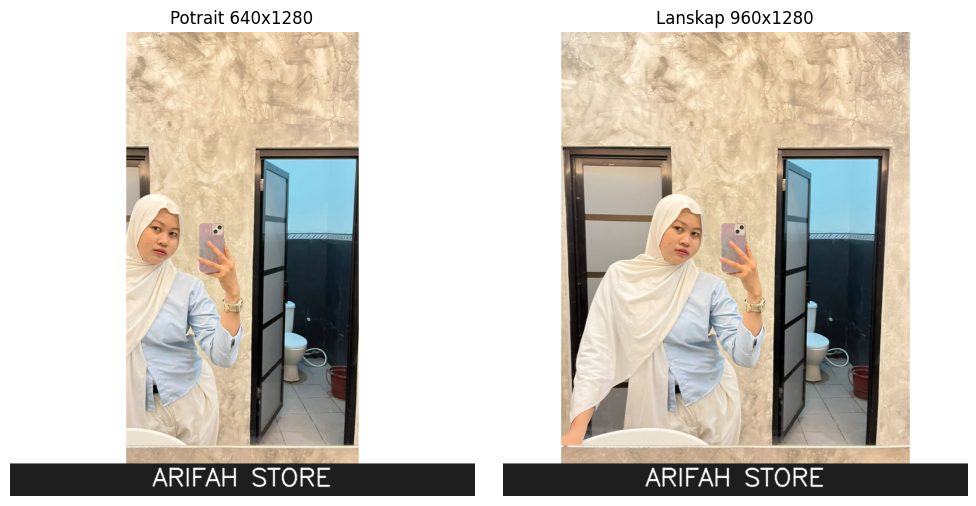

In [40]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def buat_thumbnail_persegi(img_bgr, ukuran_kanvas, warna_latar=(255, 255, 255), nama_toko='TOKO SAYA'):
    h, w = img_bgr.shape[:2]
    skala = ukuran_kanvas / max(h, w)
    w_baru, h_baru = int(w * skala), int(h * skala)
    citra_resize = cv2.resize(img_bgr, (w_baru, h_baru))

    kanvas = np.full((ukuran_kanvas, ukuran_kanvas, 3), warna_latar, dtype=np.uint8)
    x_off, y_off = (ukuran_kanvas - w_baru) // 2, (ukuran_kanvas - h_baru) // 2
    kanvas[y_off:y_off + h_baru, x_off:x_off + w_baru] = citra_resize

    tinggi_bar = int(ukuran_kanvas * 0.07)
    cv2.rectangle(kanvas, (0, ukuran_kanvas - tinggi_bar), (ukuran_kanvas, ukuran_kanvas), (30, 30, 30), -1)
    skala_font = tinggi_bar / 40
    (teks_w, teks_h), _ = cv2.getTextSize(nama_toko, cv2.FONT_HERSHEY_SIMPLEX, skala_font, 2)
    x, y = (ukuran_kanvas - teks_w) // 2, ukuran_kanvas - tinggi_bar // 3
    cv2.putText(kanvas, nama_toko, (x, y), cv2.FONT_HERSHEY_SIMPLEX, skala_font, (255, 255, 255), 2, cv2.LINE_AA)

    return kanvas

img = cv2.imread('photos.jpeg')
if img is None:
    raise FileNotFoundError("photos.jpeg tidak ditemukan — upload ulang filenya")

h, w = img.shape[:2]
produk_lanskap = img
produk_potrait = img[:, w // 4 : w // 4 + h // 2]  # crop tengah jadi lebih sempit dari tinggi

thumb1 = buat_thumbnail_persegi(produk_potrait, 800, nama_toko='ARIFAH STORE')
thumb2 = buat_thumbnail_persegi(produk_lanskap, 800, nama_toko='ARIFAH STORE')

fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(cv2.cvtColor(thumb1, cv2.COLOR_BGR2RGB))
axes[0].set_title(f'Potrait {produk_potrait.shape[1]}x{produk_potrait.shape[0]}')
axes[0].axis('off')

axes[1].imshow(cv2.cvtColor(thumb2, cv2.COLOR_BGR2RGB))
axes[1].set_title(f'Lanskap {produk_lanskap.shape[1]}x{produk_lanskap.shape[0]}')
axes[1].axis('off')

plt.tight_layout()
plt.show()